In [8]:
import pandas as pd
df = pd.read_csv('Desktop/Electric_Vehicle_Population_Data.csv')

In [9]:
print(df.head())

   VIN (1-10)     County       City State  Postal Code  Model Year     Make  \
0  5UXTA6C0XM     Kitsap    Seabeck    WA      98380.0        2021      BMW   
1  5YJ3E1EB1J     Kitsap    Poulsbo    WA      98370.0        2018    TESLA   
2  WP0AD2A73G  Snohomish    Bothell    WA      98012.0        2016  PORSCHE   
3  5YJ3E1EB5J     Kitsap  Bremerton    WA      98310.0        2018    TESLA   
4  1N4AZ1CP3K       King    Redmond    WA      98052.0        2019   NISSAN   

      Model                   Electric Vehicle Type  \
0        X5  Plug-in Hybrid Electric Vehicle (PHEV)   
1   MODEL 3          Battery Electric Vehicle (BEV)   
2  PANAMERA  Plug-in Hybrid Electric Vehicle (PHEV)   
3   MODEL 3          Battery Electric Vehicle (BEV)   
4      LEAF          Battery Electric Vehicle (BEV)   

  Clean Alternative Fuel Vehicle (CAFV) Eligibility  Electric Range  \
0           Clean Alternative Fuel Vehicle Eligible            30.0   
1           Clean Alternative Fuel Vehicle Eligible 

In [10]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 210165 entries, 0 to 210164
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         210165 non-null  object 
 1   County                                             210161 non-null  object 
 2   City                                               210161 non-null  object 
 3   State                                              210165 non-null  object 
 4   Postal Code                                        210161 non-null  float64
 5   Model Year                                         210165 non-null  int64  
 6   Make                                               210165 non-null  object 
 7   Model                                              210165 non-null  object 
 8   Electric Vehicle Type                              210165 non-null  object

In [11]:
print(df.describe())

         Postal Code     Model Year  Electric Range      Base MSRP  \
count  210161.000000  210165.000000   210160.000000  210160.000000   
mean    98178.209406    2021.048657       50.602241     897.676889   
std      2445.429402       2.988941       86.973210    7653.588604   
min      1731.000000    1999.000000        0.000000       0.000000   
25%     98052.000000    2019.000000        0.000000       0.000000   
50%     98125.000000    2022.000000        0.000000       0.000000   
75%     98374.000000    2023.000000       42.000000       0.000000   
max     99577.000000    2025.000000      337.000000  845000.000000   

       Legislative District  DOL Vehicle ID  2020 Census Tract  
count         209720.000000    2.101650e+05       2.101610e+05  
mean              28.929954    2.290774e+08       5.297929e+10  
std               14.908392    7.115519e+07       1.551466e+09  
min                1.000000    4.469000e+03       1.001020e+09  
25%               17.000000    1.948816e+08 

In [12]:
missingValues = df.isnull().sum()
Frequency = (missingValues / len(df)) * 100

In [13]:
missing_values = df.isnull().sum()
total_rows = len(df)

In [14]:
for column, missing_count in missing_values.items():
    if missing_count > 0:
        percentage = (missing_count / total_rows) * 100
        print(f"{column}: missing values = {missing_count} || ({percentage:.6f}%)")

County: missing values = 4 || (0.001903%)
City: missing values = 4 || (0.001903%)
Postal Code: missing values = 4 || (0.001903%)
Electric Range: missing values = 5 || (0.002379%)
Base MSRP: missing values = 5 || (0.002379%)
Legislative District: missing values = 445 || (0.211738%)
Vehicle Location: missing values = 10 || (0.004758%)
Electric Utility: missing values = 4 || (0.001903%)
2020 Census Tract: missing values = 4 || (0.001903%)


In [15]:
df_imputed = df.copy()
#Median and Mean Imputation for Numerical Columns
df_imputed['Base MSRP'] = df_imputed['Base MSRP'].fillna(df_imputed['Base MSRP'].mean())  
df_imputed['Electric Range'] = df_imputed['Electric Range'].fillna(df_imputed['Electric Range'].median())  

In [16]:
# Drop rows with any missing values and compare
df_dropped = df.dropna()
print("\nDropped Rows Data Statistics:\n", df_dropped.describe())


Dropped Rows Data Statistics:
          Postal Code     Model Year  Electric Range      Base MSRP  \
count  209709.000000  209709.000000   209709.000000  209709.000000   
mean    98266.123528    2021.049478       50.591973     896.044710   
std       307.778373       2.989276       86.960781    7646.059873   
min     98001.000000    1999.000000        0.000000       0.000000   
25%     98052.000000    2019.000000        0.000000       0.000000   
50%     98125.000000    2022.000000        0.000000       0.000000   
75%     98374.000000    2023.000000       42.000000       0.000000   
max     99403.000000    2025.000000      337.000000  845000.000000   

       Legislative District  DOL Vehicle ID  2020 Census Tract  
count         209709.000000    2.097090e+05       2.097090e+05  
mean              28.930394    2.290932e+08       5.303999e+10  
std               14.908422    7.116107e+07       1.637504e+07  
min                1.000000    4.469000e+03       5.300195e+10  
25%         

In [17]:
#  Compare Descriptive Statistics
print("\nOriginal Data Statistics:\n", df.describe())
print("\nImputed Data Statistics:\n", df_imputed.describe())


Original Data Statistics:
          Postal Code     Model Year  Electric Range      Base MSRP  \
count  210161.000000  210165.000000   210160.000000  210160.000000   
mean    98178.209406    2021.048657       50.602241     897.676889   
std      2445.429402       2.988941       86.973210    7653.588604   
min      1731.000000    1999.000000        0.000000       0.000000   
25%     98052.000000    2019.000000        0.000000       0.000000   
50%     98125.000000    2022.000000        0.000000       0.000000   
75%     98374.000000    2023.000000       42.000000       0.000000   
max     99577.000000    2025.000000      337.000000  845000.000000   

       Legislative District  DOL Vehicle ID  2020 Census Tract  
count         209720.000000    2.101650e+05       2.101610e+05  
mean              28.929954    2.290774e+08       5.297929e+10  
std               14.908392    7.115519e+07       1.551466e+09  
min                1.000000    4.469000e+03       1.001020e+09  
25%             

In [18]:
# Apply One-Hot Encoding for 'Make' and 'Model'
df_encoded = pd.get_dummies(df, columns=['Make', 'Model'], drop_first=True)


In [102]:
print(df_encoded.head())


   VIN (1-10)     County       City State  Postal Code  Model Year  \
0  5UXTA6C0XM     Kitsap    Seabeck    WA      98380.0        2021   
1  5YJ3E1EB1J     Kitsap    Poulsbo    WA      98370.0        2018   
2  WP0AD2A73G  Snohomish    Bothell    WA      98012.0        2016   
3  5YJ3E1EB5J     Kitsap  Bremerton    WA      98310.0        2018   
4  1N4AZ1CP3K       King    Redmond    WA      98052.0        2019   

                    Electric Vehicle Type  \
0  Plug-in Hybrid Electric Vehicle (PHEV)   
1          Battery Electric Vehicle (BEV)   
2  Plug-in Hybrid Electric Vehicle (PHEV)   
3          Battery Electric Vehicle (BEV)   
4          Battery Electric Vehicle (BEV)   

  Clean Alternative Fuel Vehicle (CAFV) Eligibility  Electric Range  \
0           Clean Alternative Fuel Vehicle Eligible            30.0   
1           Clean Alternative Fuel Vehicle Eligible           215.0   
2             Not eligible due to low battery range            15.0   
3           Clean Altern

In [103]:
# Apply Min-Max 
minmax_features = ['Electric Range', 'Base MSRP']
for feature in minmax_features:
    min_value = df[feature].min()
    max_value = df[feature].max()
    df[f"{feature}_minmax"] = (df[feature] - min_value) / (max_value - min_value)

In [104]:
print(df.head())

   VIN (1-10)     County       City State  Postal Code  Model Year     Make  \
0  5UXTA6C0XM     Kitsap    Seabeck    WA      98380.0        2021      BMW   
1  5YJ3E1EB1J     Kitsap    Poulsbo    WA      98370.0        2018    TESLA   
2  WP0AD2A73G  Snohomish    Bothell    WA      98012.0        2016  PORSCHE   
3  5YJ3E1EB5J     Kitsap  Bremerton    WA      98310.0        2018    TESLA   
4  1N4AZ1CP3K       King    Redmond    WA      98052.0        2019   NISSAN   

      Model                   Electric Vehicle Type  \
0        X5  Plug-in Hybrid Electric Vehicle (PHEV)   
1   MODEL 3          Battery Electric Vehicle (BEV)   
2  PANAMERA  Plug-in Hybrid Electric Vehicle (PHEV)   
3   MODEL 3          Battery Electric Vehicle (BEV)   
4      LEAF          Battery Electric Vehicle (BEV)   

  Clean Alternative Fuel Vehicle (CAFV) Eligibility  ... DOL Vehicle ID  \
0           Clean Alternative Fuel Vehicle Eligible  ...      267929112   
1           Clean Alternative Fuel Vehicle E

In [22]:
# Apply Z-score 
zscore_features = ['Model Year', 'DOL Vehicle ID']  
for feature in zscore_features:
    mean = df[feature].mean()
    std = df[feature].std()
    df[f"{feature}_zscore"] = (df[feature] - mean) / std


print(df.head())


   VIN (1-10)     County       City State  Postal Code  Model Year     Make  \
0  5UXTA6C0XM     Kitsap    Seabeck    WA      98380.0        2021      BMW   
1  5YJ3E1EB1J     Kitsap    Poulsbo    WA      98370.0        2018    TESLA   
2  WP0AD2A73G  Snohomish    Bothell    WA      98012.0        2016  PORSCHE   
3  5YJ3E1EB5J     Kitsap  Bremerton    WA      98310.0        2018    TESLA   
4  1N4AZ1CP3K       King    Redmond    WA      98052.0        2019   NISSAN   

      Model                   Electric Vehicle Type  \
0        X5  Plug-in Hybrid Electric Vehicle (PHEV)   
1   MODEL 3          Battery Electric Vehicle (BEV)   
2  PANAMERA  Plug-in Hybrid Electric Vehicle (PHEV)   
3   MODEL 3          Battery Electric Vehicle (BEV)   
4      LEAF          Battery Electric Vehicle (BEV)   

  Clean Alternative Fuel Vehicle (CAFV) Eligibility  ...  Base MSRP  \
0           Clean Alternative Fuel Vehicle Eligible  ...        0.0   
1           Clean Alternative Fuel Vehicle Eligible 

In [107]:
zscore_columns = [f"{feature}_zscore" for feature in zscore_features]
print(df[zscore_columns].head())

   Model Year_zscore  DOL Vehicle ID_zscore
0          -0.016279               0.546013
1          -1.019979               3.468953
2          -1.689112              -1.786323
3          -1.019979               3.447202
4          -0.685412               3.475067


In [26]:
print("Number of zero values in each column:")
print((df[Descriptive] == 0).sum())
#%5

Number of zero values in each column:
Electric Range    0
Base MSRP         0
dtype: int64


In [27]:
df[Descriptive] = df[Descriptive].replace(0, pd.NA)
summary_stats = pd.DataFrame({
    'Mean': df[Descriptive].mean(),
    'Median': df[Descriptive].median(),
    'Standard Deviation': df[Descriptive].std()
})
print(summary_stats)


                        Mean   Median Standard Deviation
Electric Range    116.217155     75.0          98.728475
Base MSRP       57012.926866  59900.0       22829.647001


In [33]:
#6


zsh:1: command not found: pip


In [48]:
!python3 -m pip install plotly



[notice] A new release of pip is available: 23.2.1 -> 24.3.1
[notice] To update, run: pip3 install --upgrade pip


In [51]:
%pip install plotly


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 20.5 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: /opt/homebrew/Cellar/jupyterlab/4.2.5_1/libexec/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [52]:
import plotly.express as px


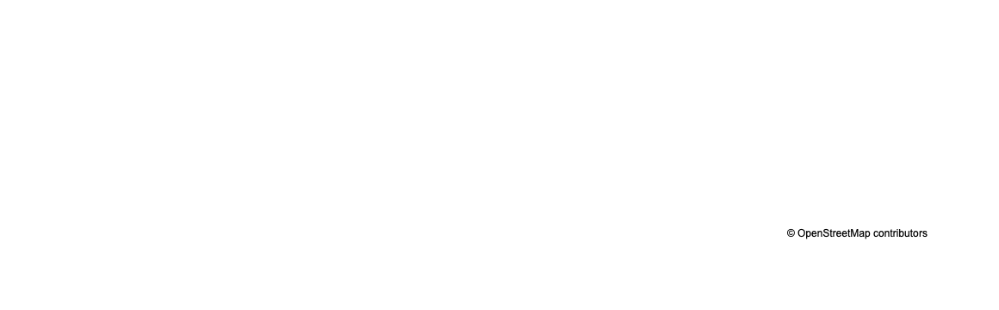

In [108]:
if 'Vehicle Location' in df.columns:
    df[['Longitude', 'Latitude']] = df['Vehicle Location'].str.extract(r'POINT \((.*?) (.*?)\)').astype(float)


fig = px.scatter_mapbox(
    df,
    lat="Latitude",
    lon="Longitude",
    hover_name="Make",  
    zoom=10,
    mapbox_style="open-street-map"
)

fig.show()

In [56]:
model_counts = df['Model'].value_counts()

print("Top 10 Most Popular EV Models:")
print(model_counts.head(10))

Top 10 Most Popular EV Models:
Model
MODEL Y           44038
MODEL 3           32520
LEAF              13606
MODEL S            7795
BOLT EV            6780
MODEL X            6239
VOLT               4815
ID.4               4716
MUSTANG MACH-E     4363
WRANGLER           4116
Name: count, dtype: int64


In [57]:
import matplotlib.pyplot as plt


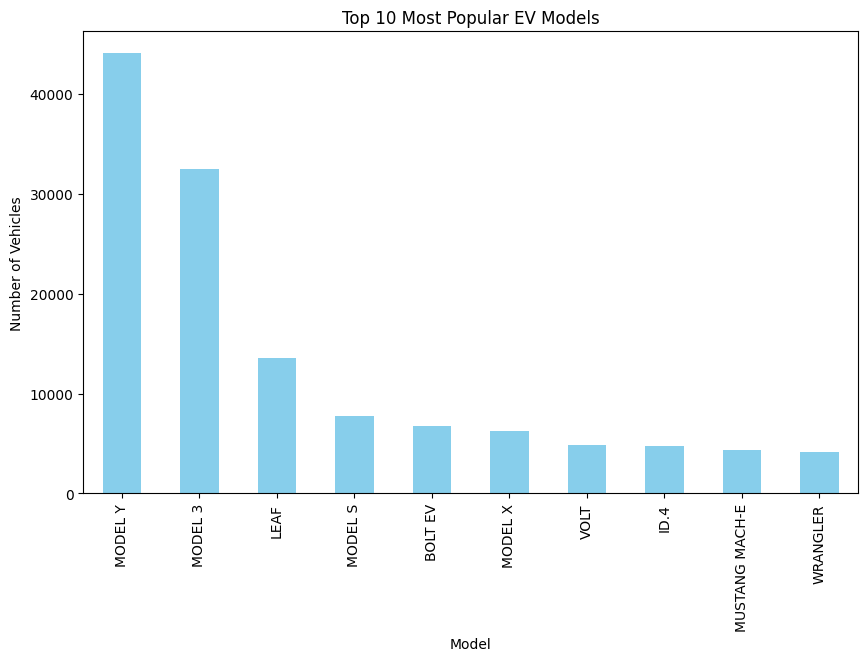

In [59]:
model_counts.head(10).plot(kind='bar', color='skyblue', figsize=(10, 6))
plt.title("Top 10 Most Popular EV Models")
plt.xlabel("Model")
plt.ylabel("Number of Vehicles")
plt.show()

In [61]:
numeric_df = df.select_dtypes(include=['float64', 'int64']).fillna(0)
correlation_matrix = numeric_df.corr()
print("Correlation Matrix:")
print(correlation_matrix)

Correlation Matrix:
                       Postal Code  Model Year  Legislative District  \
Postal Code               1.000000   -0.000693              0.018969   
Model Year               -0.000693    1.000000             -0.016191   
Legislative District      0.018969   -0.016191              1.000000   
DOL Vehicle ID            0.005389    0.215703             -0.010241   
2020 Census Tract         0.521067    0.005152              0.074912   
Electric Range_minmax    -0.000932   -0.513540              0.018689   
Base MSRP_minmax         -0.004581   -0.230651              0.010036   
Model Year_zscore        -0.000693    1.000000             -0.016191   
DOL Vehicle ID_zscore     0.005389    0.215703             -0.010241   
Longitude                -0.717461   -0.003913             -0.227499   
Latitude                  0.392953    0.000225              0.207366   

                       DOL Vehicle ID  2020 Census Tract  \
Postal Code                  0.005389           0.52106

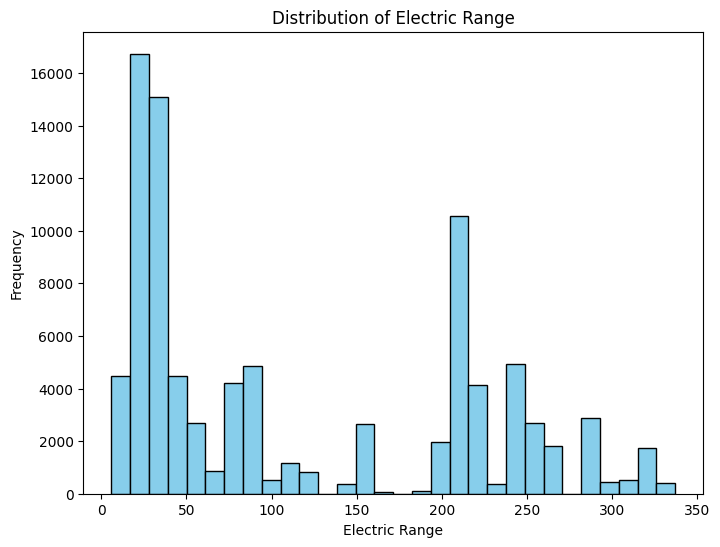

In [63]:
plt.figure(figsize=(8, 6))
plt.hist(df['Electric Range'].dropna(), bins=30, color='skyblue', edgecolor='black')
plt.title("Distribution of Electric Range")
plt.xlabel("Electric Range")
plt.ylabel("Frequency")
plt.show()

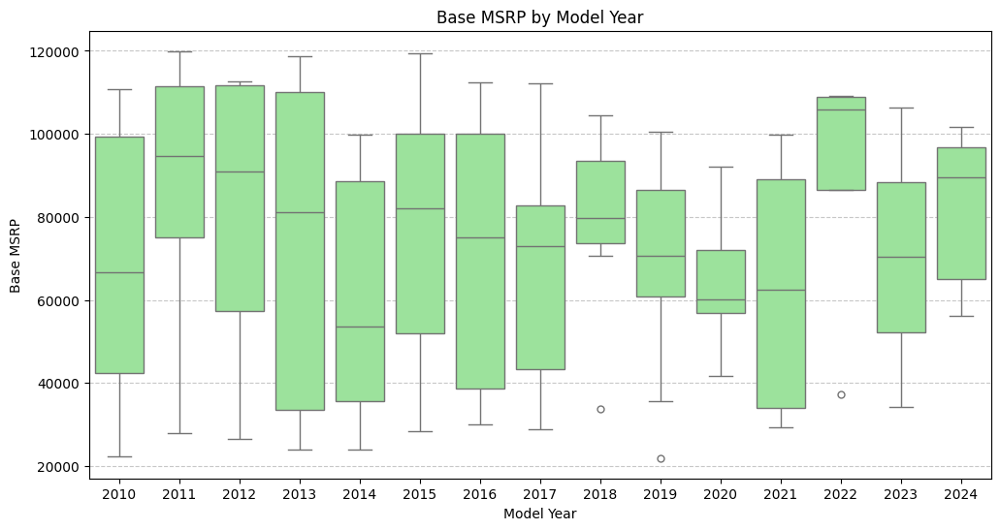

In [112]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

np.random.seed(0)
years = np.random.choice(range(2010, 2025), 100)
base_msrp = np.random.choice(range(20000, 120000), 100)
data = pd.DataFrame({'Model Year': years, 'Base MSRP': base_msrp})

plt.figure(figsize=(12, 6))
sns.boxplot(
    data=data,
    x='Model Year',
    y='Base MSRP',
    color="lightgreen",
    fliersize=5,  
    flierprops=dict(marker='o', color='Red') 
)

plt.title("Base MSRP by Model Year")
plt.xlabel("Model Year")
plt.ylabel("Base MSRP")
plt.grid(axis='y', linestyle='--', alpha=0.7) 
plt.show()


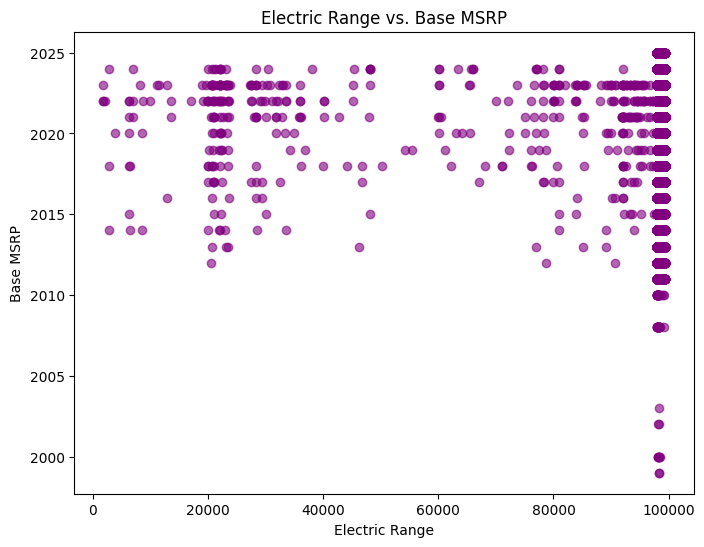

In [89]:
plt.figure(figsize=(8, 6))
plt.scatter(df['Postal Code'], df['Model Year'], color='purple', alpha=0.6)
plt.title("Electric Range vs. Base MSRP")
plt.xlabel("Electric Range")
plt.ylabel("Base MSRP")
plt.show()


In [101]:
print(df['Base MSRP'].head(10))


0    57012.926866
1    57012.926866
2    57012.926866
3    57012.926866
4    57012.926866
5    57012.926866
6    57012.926866
7    57012.926866
8    57012.926866
9    57012.926866
Name: Base MSRP, dtype: float64


In [100]:
df = df.dropna(subset=['Base MSRP'])


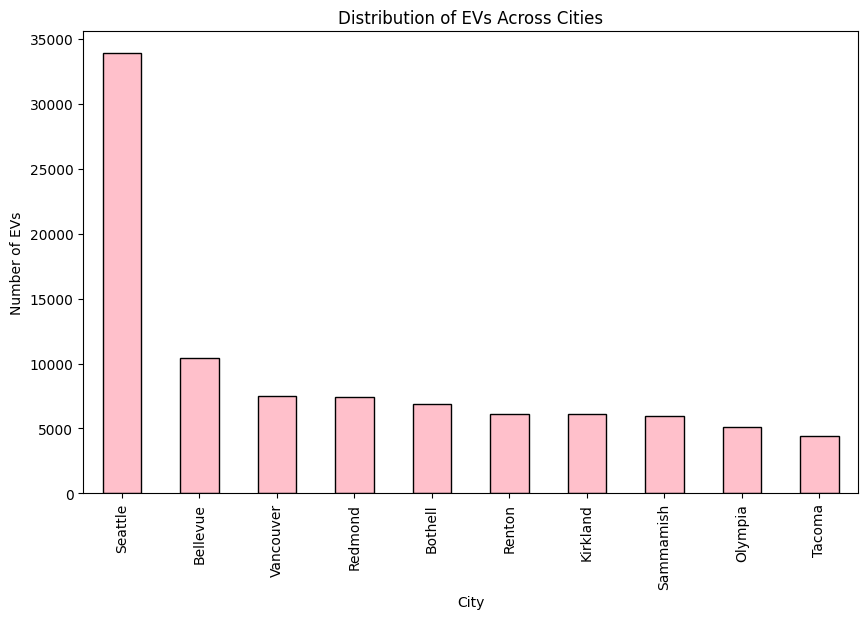

In [115]:
#10
import matplotlib.pyplot as plt

city_counts = df['City'].value_counts().head(10)  

plt.figure(figsize=(10, 6))
city_counts.plot(kind='bar', color='Pink', edgecolor='black')
plt.title("Distribution of EVs Across Cities")
plt.xlabel("City")
plt.ylabel("Number of EVs")
plt.show()


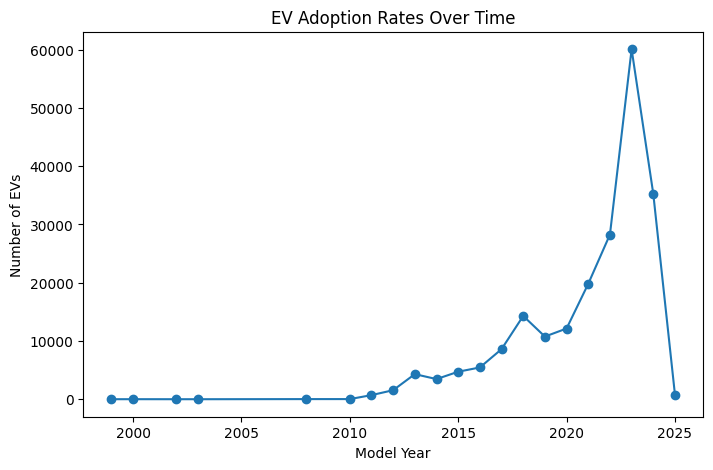

In [116]:
#11
yearly_counts = df['Model Year'].value_counts().sort_index()

yearly_counts.plot(kind='line', marker='o', title="EV Adoption Rates Over Time", xlabel="Model Year", ylabel="Number of EVs", figsize=(8, 5))
plt.show()


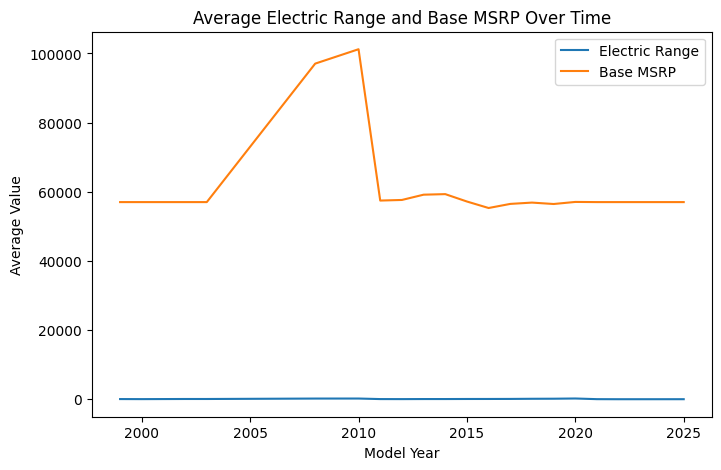

In [117]:
yearly_averages = df.groupby('Model Year')[['Electric Range', 'Base MSRP']].mean()
yearly_averages.plot(title="Average Electric Range and Base MSRP Over Time", xlabel="Model Year", ylabel="Average Value", figsize=(8, 5))
plt.show()